### Precipitation dataset:
- corrected datasets
  /glade/scratch/arugg
  BC  DS DSBC
  lat = 496    22.03125, 22.09375, ...... , 52.90625, 52.96875
  lon = 928  -124.9688, -124.9062, ...... , -67.09375, -67.03125   
  
 
 -  Livneh
 lat = 444 ;  25.15625, 25.21875, ....,  52.78125, 52.84375
 lon = 922 ;  235.40625, 235.46875, ......, 292.90625, 292.96875 (=-67.03125)

- processed dataset: <br>
  /glade/campaign/mmm/c3we/mingge/CESM,   BC,  DS, DSBC <br>
  prec_yyyymm_mem_DSBC.nc,  prec_yyyymm_mem_BC.nc,  prec_yyyymm_mem_DS.nc
  prec_198001_001_BC.nc, ..., prec_201012_010_DSBC.nc
 
     

In [ ]:
# Kernel casper_2020

In [1]:
# Import packages
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util as cutil
import matplotlib.ticker as mticker
#from matplotlib import ticker, cm
from matplotlib.colors import LogNorm
from matplotlib.ticker import LogFormatter 
import matplotlib.colors as mcolors
%matplotlib inline
from scipy.stats import pearsonr 

#GeoCAT Specific packages
from geocat.viz import util as gvutil
import geocat.datafiles as gdf
from IPython.display import IFrame
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
#from psif_func import plot_seasonal_4
from importlib import reload
import psif_func
import config
reload(psif_func)
 
from psif_func import plot_diff_3
from psif_func import plot_seasonal
from psif_func import plot_mpas_diff_3
from psif_func import plot_box_shp_3
from psif_func import plot_ts_shp_3

NOTE: For BC, DS, DSBC. They are already on Livneh grid, no mask, no interpotlation
     prec_1981-2010_clim_CONUS.nc  prec_2041-2070_clim_CONUS.nc      prec_mean_cesm_bc.ncl
     p95_CESM_1981-2010_CONUS_wy.nc / p95_CESM_2041-2070_CONUS_wy.nc
     interpolate to Livneh grid

In [2]:
dir_plot = '/glade/campaign/mmm/c3we/mingge/PSIF/PLOT/'
dir_cesm = '/glade/campaign/mmm/c3we/mingge/CESM/'
dir_liv  = '/glade/campaign/mmm/c3we/mingge/LIVNEH/'

In [3]:
flnm_p95_liv       = 'p95_LIVNEH_1981-2010_wy.nc'
flnm_mean_liv      = 'prec_mean_1981-2010_livneh_wy.nc'
flnm_prec_shp_liv  = 'prec_1981-2010_livneh_shp_wy.nc'
 

In [4]:
# For Allyson's CESM bias correctin downscaling
flnm_cdd_liv       = 'cdd_LIVNEH_1981-2010_2d.nc'
flnm_cdd_shp_liv   = 'cdd_1981-2010_monthly_livneh_shp.nc'
flnm_cwd_liv       = 'cwd_LIVNEH_1981-2010_2d.nc'
flnm_cwd_shp_liv   = 'cwd_1981-2010_monthly_livneh_shp.nc'
flnm_p999_liv      = 'p999_LIVNEH_1981-2010.nc'

In [5]:
## CESM
flnm_cesm = 'prec_1981-2010_CESM_LivnehGrid_wy.nc'
flnm_shp_cesm = 'prec_1981-2010_cesm_shp_wy.nc'

## BC
flnm_cesm_bc = 'prec_mean_1981-2010_LivGrd_wy.nc'
flnm_p95_cesm_bc = 'p95_1981-2010_BC_wy.nc'
flnm_shp_cesm_bc = 'prec_mean_1981-2010_BC_shp_wy.nc'
flnm_p95_shp_cesm_bc = 'p95_1981-2010_BC_shp_wy.nc'

# DS
flnm_cesm_ds = 'prec_mean_1981-2010_LivGrd_wy.nc'
flnm_p95_cesm_ds = 'p95_1981-2010_DS_wy.nc'
flnm_shp_cesm_ds = 'prec_mean_1981-2010_DS_shp_wy.nc'
flnm_p95_shp_cesm_ds = 'p95_1981-2010_DS_shp_wy.nc'

# DSBC
flnm_cesm_dsbc = 'prec_mean_1981-2010_LivGrd_wy.nc'
flnm_p95_cesm_dsbc = 'p95_1981-2010_DSBC_wy.nc'
flnm_shp_cesm_dsbc = 'prec_mean_1981-2010_DSBC_shp_wy.nc'
flnm_p95_shp_cesm_dsbc = 'p95_1981-2010_DSBC_shp_wy.nc'


In [6]:
with xr.open_dataset(dir_liv + flnm_mean_liv) as ds_mean_liv:
  print(dir_liv + flnm_mean_liv)  

with xr.open_dataset(dir_liv + flnm_p95_liv) as ds_p95_liv:
  print(dir_liv + flnm_p95_liv) 

with xr.open_dataset(dir_liv + flnm_prec_shp_liv) as ds_prec_shp_liv:
  print(dir_liv + flnm_prec_shp_liv) 

/glade/campaign/mmm/c3we/mingge/LIVNEH/prec_mean_1981-2010_livneh_wy.nc
/glade/campaign/mmm/c3we/mingge/LIVNEH/p95_LIVNEH_1981-2010_wy.nc
/glade/campaign/mmm/c3we/mingge/LIVNEH/prec_1981-2010_livneh_shp_wy.nc


In [7]:
with xr.open_dataset(dir_cesm + flnm_cesm ) as ds_prec_cesm:
  print(dir_cesm + flnm_cesm)

with xr.open_dataset(dir_cesm + flnm_shp_cesm ) as ds_prec_shp_cesm:
  print(dir_cesm + flnm_shp_cesm) 

## BC 
with xr.open_dataset(dir_cesm + 'BC/' + flnm_cesm_bc ) as ds_mean_cesm_bc:
  print(dir_cesm + flnm_cesm_bc)
with xr.open_dataset(dir_cesm + 'BC/' + flnm_p95_cesm_bc ) as ds_p95_cesm_bc:
  print(dir_cesm + flnm_p95_cesm_bc)

with xr.open_dataset(dir_cesm + 'BC/' + flnm_shp_cesm_bc ) as ds_prec_shp_cesm_bc:
  print(dir_cesm + flnm_shp_cesm_bc) 
with xr.open_dataset(dir_cesm + 'BC/' + flnm_p95_shp_cesm_bc ) as ds_p95_shp_cesm_bc:
  print(dir_cesm + flnm_p95_shp_cesm_bc)

## DS 
with xr.open_dataset(dir_cesm + 'DS/' + flnm_cesm_ds) as ds_mean_cesm_ds:
  print(dir_cesm + flnm_cesm_ds)
with xr.open_dataset(dir_cesm + 'DS/' + flnm_p95_cesm_ds) as ds_p95_cesm_ds:
  print(dir_cesm + flnm_p95_cesm_ds)

with xr.open_dataset(dir_cesm + 'DS/' + flnm_shp_cesm_ds) as ds_prec_shp_cesm_ds:
  print(dir_cesm + flnm_shp_cesm_ds) 
with xr.open_dataset(dir_cesm + 'DS/' + flnm_p95_shp_cesm_ds) as ds_p95_shp_cesm_ds:
  print(dir_cesm + flnm_p95_shp_cesm_ds)

## DSBC 
with xr.open_dataset(dir_cesm + 'DSBC/' + flnm_cesm_dsbc) as ds_mean_cesm_dsbc:
  print(dir_cesm + flnm_cesm_dsbc)
with xr.open_dataset(dir_cesm + 'DSBC/' + flnm_p95_cesm_dsbc) as ds_p95_cesm_dsbc:
  print(dir_cesm + flnm_p95_cesm_dsbc)

with xr.open_dataset(dir_cesm + 'DSBC/' + flnm_shp_cesm_dsbc) as ds_prec_shp_cesm_dsbc:
  print(dir_cesm + flnm_shp_cesm_dsbc) 
with xr.open_dataset(dir_cesm + 'DSBC/' + flnm_p95_shp_cesm_dsbc) as ds_p95_shp_cesm_dsbc:
  print(dir_cesm + flnm_p95_shp_cesm_dsbc)

/glade/campaign/mmm/c3we/mingge/CESM/prec_1981-2010_CESM_LivnehGrid_wy.nc
/glade/campaign/mmm/c3we/mingge/CESM/prec_1981-2010_cesm_shp_wy.nc
/glade/campaign/mmm/c3we/mingge/CESM/prec_mean_1981-2010_LivGrd_wy.nc
/glade/campaign/mmm/c3we/mingge/CESM/p95_1981-2010_BC_wy.nc
/glade/campaign/mmm/c3we/mingge/CESM/prec_mean_1981-2010_BC_shp_wy.nc
/glade/campaign/mmm/c3we/mingge/CESM/p95_1981-2010_BC_shp_wy.nc
/glade/campaign/mmm/c3we/mingge/CESM/prec_mean_1981-2010_LivGrd_wy.nc
/glade/campaign/mmm/c3we/mingge/CESM/p95_1981-2010_DS_wy.nc
/glade/campaign/mmm/c3we/mingge/CESM/prec_mean_1981-2010_DS_shp_wy.nc
/glade/campaign/mmm/c3we/mingge/CESM/p95_1981-2010_DS_shp_wy.nc
/glade/campaign/mmm/c3we/mingge/CESM/prec_mean_1981-2010_LivGrd_wy.nc
/glade/campaign/mmm/c3we/mingge/CESM/p95_1981-2010_DSBC_wy.nc
/glade/campaign/mmm/c3we/mingge/CESM/prec_mean_1981-2010_DSBC_shp_wy.nc
/glade/campaign/mmm/c3we/mingge/CESM/p95_1981-2010_DSBC_shp_wy.nc


In [8]:
ds_mean_liv.coords['lon'] = ds_mean_cesm_bc.coords['lon']
ds_p95_liv.coords['lon']  = ds_mean_cesm_bc.coords['lon']
ds_prec_cesm.coords['lon'] = ds_mean_cesm_bc.coords['lon']
ds_mean_liv.coords['year'] = ds_prec_cesm.coords['year']
ds_mean_cesm_ds.coords['year'] = ds_prec_cesm.coords['year']
ds_mean_cesm_bc.coords['year'] = ds_prec_cesm.coords['year']
ds_mean_cesm_dsbc.coords['year'] = ds_prec_cesm.coords['year']

### Climatology

 - Precipitation CESM vs. Livneh

<Figure size 1152x768 with 0 Axes>

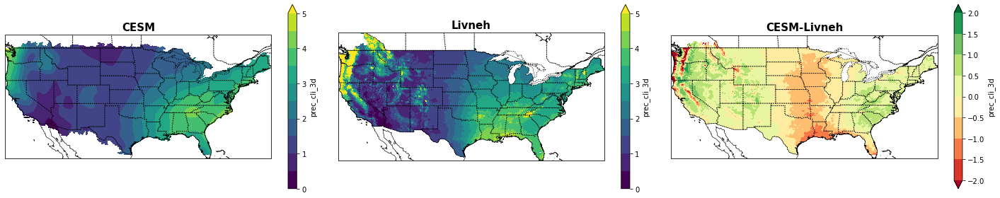

In [73]:
prec_liv  = ds_mean_liv.prec_cli
prec_cesm = ds_prec_cesm.prec_cli_3d.mean(dim=('member'))
prec_dif  = prec_cesm - prec_liv 

data_3d = xr.concat([prec_cesm, prec_liv, prec_dif] , "new_dim")
title_s = ['CESM', 'Livneh', 'CESM-Livneh']

cnlevel_0   = np.linspace(0, 5, num=11)
cnlevel_dif = np.linspace(-2, 2, num=9)

fig = plt.figure(figsize=(12,8), dpi=96) 
plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif);

plt.savefig(dir_plot + "prec_cesm_cli.png", bbox_inches='tight');


 - precipitation CESM-DS

<Figure size 864x576 with 0 Axes>

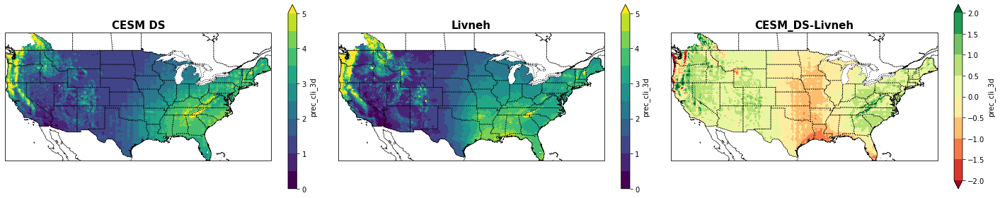

In [74]:
prec_liv  = ds_mean_liv.prec_cli
prec_cesm = ds_mean_cesm_ds.prec_cli_3d.mean(dim=('member'))
prec_dif  = prec_cesm - prec_liv 

data_3d = xr.concat([prec_cesm, prec_liv, prec_dif] , "new_dim")
title_s = ['CESM DS', 'Livneh', 'CESM_DS-Livneh']

cnlevel_0   = np.linspace(0, 5, num=11)
cnlevel_dif = np.linspace(-2, 2, num=9)

fig = plt.figure(figsize=(12,8)) 
plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)

plt.savefig(dir_plot + "prec_cesm_ds_cli.png", bbox_inches='tight')

 - precipitation: CESM-BC

<Figure size 1152x768 with 0 Axes>

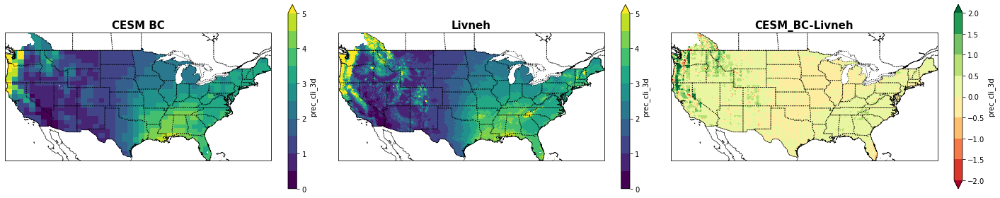

In [75]:
prec_liv  = ds_mean_liv.prec_cli
prec_cesm = ds_mean_cesm_bc.prec_cli_3d.mean(dim=('member'))
prec_dif  = prec_cesm - prec_liv 

data_3d = xr.concat([prec_cesm, prec_liv, prec_dif] , "new_dim")
title_s = ['CESM BC', 'Livneh', 'CESM_BC-Livneh']

cnlevel_0   = np.linspace(0, 5, num=11)
cnlevel_dif = np.linspace(-2, 2, num=9)

fig = plt.figure(figsize=(12,8), dpi=96) 
plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)

plt.savefig(dir_plot + "prec_cesm_bc_cli.png", bbox_inches='tight')

 - precipitations: CESM-DSBC

<Figure size 1152x768 with 0 Axes>

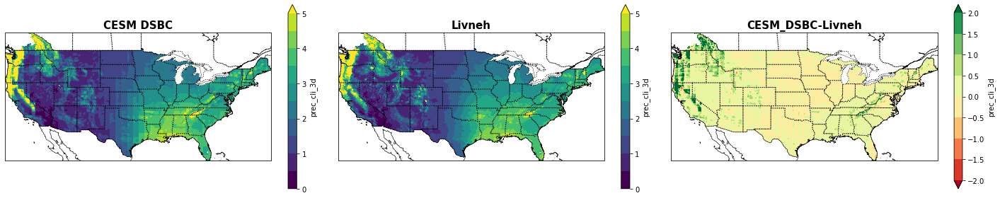

In [76]:
prec_liv  = ds_mean_liv.prec_cli
prec_cesm = ds_mean_cesm_dsbc.prec_cli_3d.mean(dim=('member'))
prec_dif  = prec_cesm - prec_liv 

data_3d = xr.concat([prec_cesm, prec_liv, prec_dif] , "new_dim")
title_s = ['CESM DSBC', 'Livneh', 'CESM_DSBC-Livneh']

cnlevel_0   = np.linspace(0, 5, num=11)
cnlevel_dif = np.linspace(-2, 2, num=9)

fig = plt.figure(figsize=(12,8), dpi=96) 
plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)

plt.savefig(dir_plot + "prec_cesm_dsbc_cli.png", bbox_inches='tight')

#### NWD
 - NWD: CESM vs. Livneh

<Figure size 1152x768 with 0 Axes>

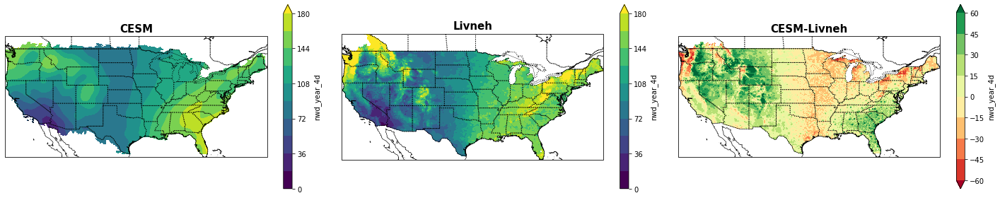

In [77]:
prec_liv  = ds_mean_liv.nwd_year_3d.mean(dim='year')
prec_cesm = ds_prec_cesm.nwd_year_4d.mean(dim=('member','year'))
prec_dif  = prec_cesm - prec_liv 

data_3d = xr.concat([prec_cesm, prec_liv, prec_dif] , "new_dim")
title_s = ['CESM', 'Livneh', 'CESM-Livneh']

cnlevel_0   = np.linspace(0, 180, num=11)
cnlevel_dif = np.linspace(-60, 60, num=9)

fig = plt.figure(figsize=(12,8), dpi=96) 
plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)

plt.savefig(dir_plot + "nwd_cesm_annual.png", bbox_inches='tight') 

 - NWD: CESM-DS vs. Livnah

<Figure size 1152x768 with 0 Axes>

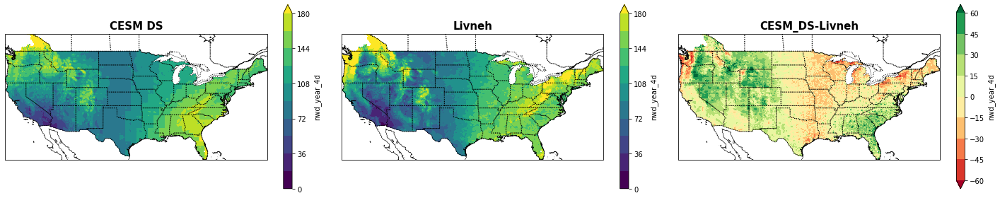

In [78]:
prec_liv  = ds_mean_liv.nwd_year_3d.mean(dim='year')
prec_cesm = ds_mean_cesm_ds.nwd_year_4d.mean(dim=('member','year'))
prec_dif  = prec_cesm - prec_liv 

data_3d = xr.concat([prec_cesm, prec_liv, prec_dif] , "new_dim")
title_s = ['CESM DS', 'Livneh', 'CESM_DS-Livneh']

cnlevel_0   = np.linspace(0, 180, num=11)
cnlevel_dif = np.linspace(-60, 60, num=9)

fig = plt.figure(figsize=(12,8), dpi=96) 
plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)

plt.savefig(dir_plot + "nwd_cesm_ds_annual.png", bbox_inches='tight') 

 - NWD: CESM-BC vs. Livneh

<Figure size 1152x768 with 0 Axes>

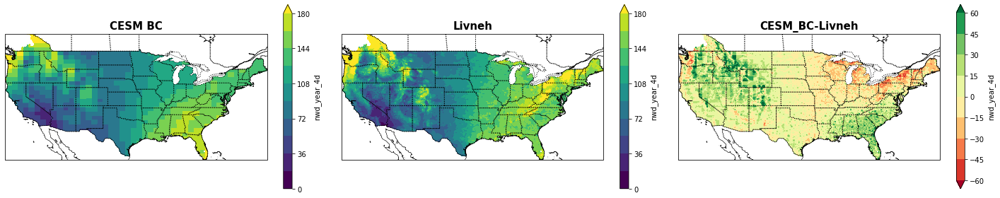

In [79]:
prec_liv  = ds_mean_liv.nwd_year_3d.mean(dim='year')
prec_cesm = ds_mean_cesm_bc.nwd_year_4d.mean(dim=('member','year'))
prec_dif  = prec_cesm - prec_liv 

data_3d = xr.concat([prec_cesm, prec_liv, prec_dif] , "new_dim")
title_s = ['CESM BC', 'Livneh', 'CESM_BC-Livneh']

cnlevel_0   = np.linspace(0, 180, num=11)
cnlevel_dif = np.linspace(-60, 60, num=9)

fig = plt.figure(figsize=(12,8), dpi=96) 
plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)

plt.savefig(dir_plot + "nwd_cesm_bc_annual.png", bbox_inches='tight') 

 - NWD: CESM-DSBC - Livneh

<Figure size 1152x768 with 0 Axes>

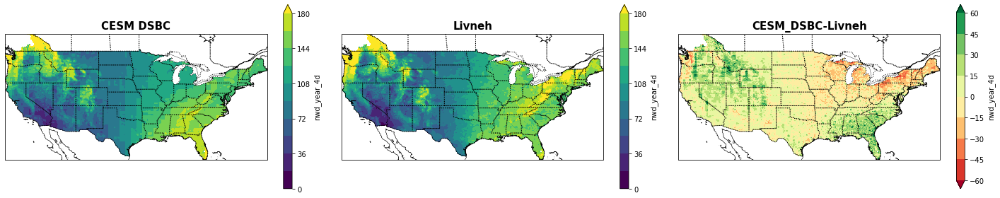

In [80]:
prec_liv  = ds_mean_liv.nwd_year_3d.mean(dim='year')
prec_cesm = ds_mean_cesm_dsbc.nwd_year_4d.mean(dim=('member','year'))
prec_dif  = prec_cesm - prec_liv 

data_3d = xr.concat([prec_cesm, prec_liv, prec_dif] , "new_dim")
title_s = ['CESM DSBC', 'Livneh', 'CESM_DSBC-Livneh']

cnlevel_0   = np.linspace(0, 180, num=11)
cnlevel_dif = np.linspace(-60, 60, num=9)

fig = plt.figure(figsize=(12,8), dpi=96) 
plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)

plt.savefig(dir_plot + "nwd_cesm_dsbc_annual.png", bbox_inches='tight') 

#### P99
 - CESM

<Figure size 1152x768 with 0 Axes>

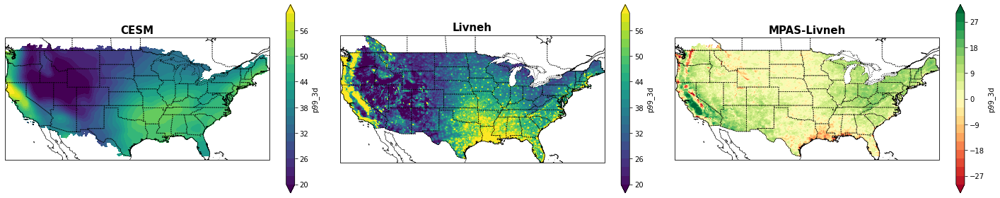

In [81]:
p99_liv  = ds_p95_liv.p99_2d
p99_cesm = ds_prec_cesm.p99_3d.mean(dim=('member'))
p99_dif  = p99_cesm - p99_liv 
 
fig = plt.figure(figsize=(12,8), dpi=96)

data_3d = xr.concat([p99_cesm, p99_liv, p99_dif] , "new_dim")
title_s = ['CESM', 'Livneh', 'MPAS-Livneh']
cnlevel_0 = np.linspace(20, 60, num=21)
cnlevel_dif = np.linspace(-30, 30, num=21)
 
plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)
 
plt.savefig(dir_plot + "p99_cesm.png", bbox_inches='tight');

 - CESM DS

<Figure size 1152x768 with 0 Axes>

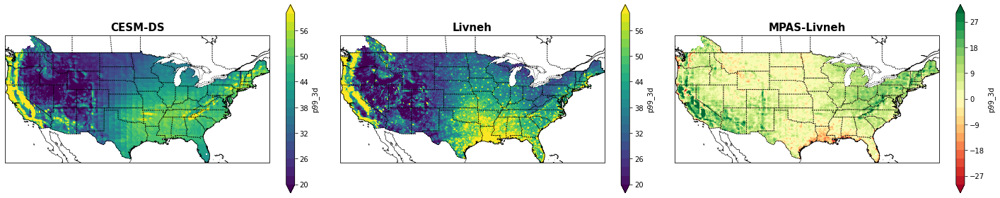

In [82]:
p99_liv  = ds_p95_liv.p99_2d
p99_cesm = ds_p95_cesm_ds.p99_3d.mean(dim=('member'))
p99_dif  = p99_cesm - p99_liv 
 
fig = plt.figure(figsize=(12,8), dpi=96) 

data_3d = xr.concat([p99_cesm, p99_liv, p99_dif] , "new_dim")
title_s = ['CESM-DS', 'Livneh', 'MPAS-Livneh']
cnlevel_0 = np.linspace(20, 60, num=21)
cnlevel_dif = np.linspace(-30, 30, num=21)

plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)
 
plt.savefig(dir_plot + "p99_cesm_ds.png", bbox_inches='tight')

 - CESM-BC 

<Figure size 1152x768 with 0 Axes>

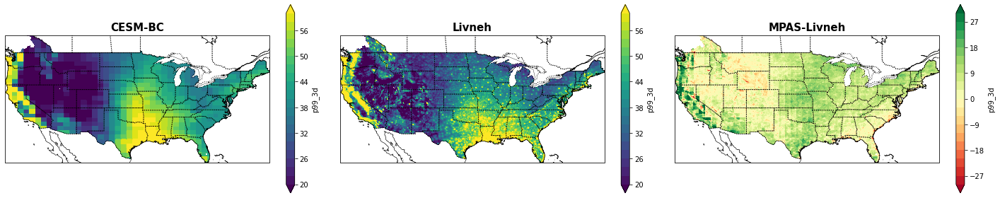

In [83]:
p99_liv  = ds_p95_liv.p99_2d
p99_cesm = ds_p95_cesm_bc.p99_3d.mean(dim=('member'))
p99_dif  = p99_cesm - p99_liv 
 
fig = plt.figure(figsize=(12,8), dpi=96) 

data_3d = xr.concat([p99_cesm, p99_liv, p99_dif] , "new_dim")
title_s = ['CESM-BC', 'Livneh', 'MPAS-Livneh']
cnlevel_0 = np.linspace(20, 60, num=21)
cnlevel_dif = np.linspace(-30, 30, num=21)

plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)
 
plt.savefig(dir_plot + "p99_cesm_bc.png", bbox_inches='tight')

 - CESM-DSBC

<Figure size 1152x768 with 0 Axes>

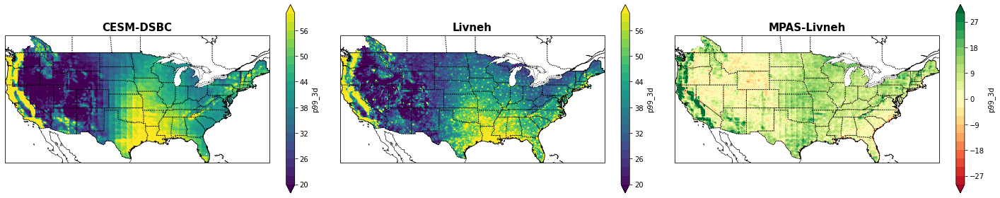

In [84]:
p99_liv  = ds_p95_liv.p99_2d
p99_cesm = ds_p95_cesm_dsbc.p99_3d.mean(dim=('member'))
p99_dif  = p99_cesm - p99_liv 
 
fig = plt.figure(figsize=(12,8), dpi=96) 

data_3d = xr.concat([p99_cesm, p99_liv, p99_dif] , "new_dim")
title_s = ['CESM-DSBC', 'Livneh', 'MPAS-Livneh']
cnlevel_0 = np.linspace(20, 60, num=21)
cnlevel_dif = np.linspace(-30, 30, num=21)

plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)
 
plt.savefig(dir_plot + "p99_cesm_dsbc.png", bbox_inches='tight')

#### P95
 - CESM

<Figure size 1152x768 with 0 Axes>

<Figure size 1152x768 with 0 Axes>

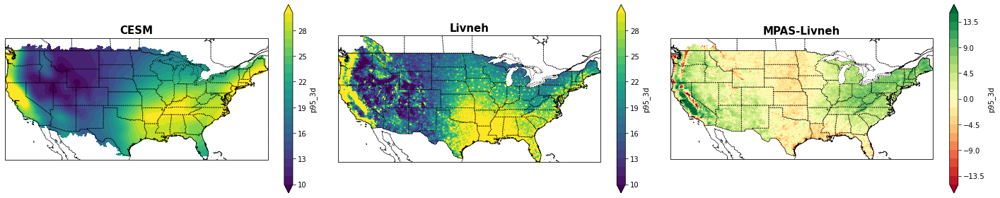

In [85]:
p99_liv  = ds_p95_liv.p95_2d
p99_cesm = ds_prec_cesm.p95_3d.mean(dim=('member'))
p99_dif  = p99_cesm - p99_liv 
 
fig = plt.figure(figsize=(12,8), dpi=96) 

data_3d = xr.concat([p99_cesm, p99_liv, p99_dif] , "new_dim")
title_s = ['CESM', 'Livneh', 'MPAS-Livneh']
cnlevel_0 = np.linspace(10, 30, num=21)
cnlevel_dif = np.linspace(-15, 15, num=21)

fig = plt.figure(figsize=(12,8), dpi=96) 
plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)
 
plt.savefig(dir_plot + "p95_cesm.png", bbox_inches='tight')

 - P95: CESM-DS

<Figure size 1152x768 with 0 Axes>

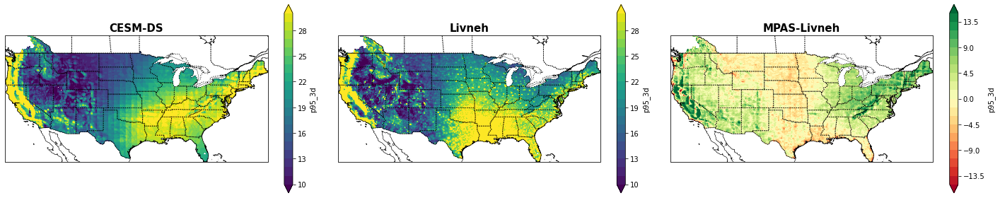

In [86]:
p99_liv  = ds_p95_liv.p95_2d
p99_cesm = ds_p95_cesm_ds.p95_3d.mean(dim=('member'))
p99_dif  = p99_cesm - p99_liv 
 
fig = plt.figure(figsize=(12,8), dpi=96) 

data_3d = xr.concat([p99_cesm, p99_liv, p99_dif] , "new_dim")
title_s = ['CESM-DS', 'Livneh', 'MPAS-Livneh']
cnlevel_0 = np.linspace(10, 30, num=21)
cnlevel_dif = np.linspace(-15, 15, num=21)

plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)
 
plt.savefig(dir_plot + "p95_cesm_ds.png", bbox_inches='tight')

 - P95:CESM-BC

<Figure size 1152x768 with 0 Axes>

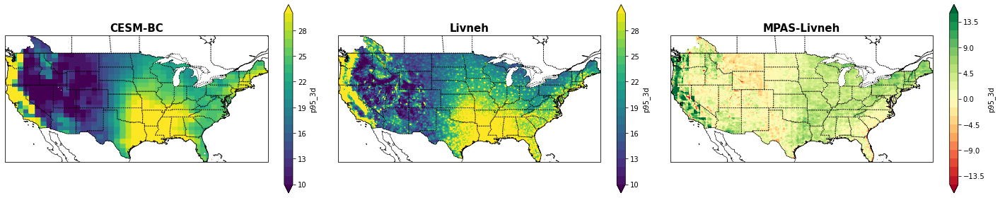

In [87]:
p99_liv  = ds_p95_liv.p95_2d
p99_cesm = ds_p95_cesm_bc.p95_3d.mean(dim=('member'))
p99_dif  = p99_cesm - p99_liv 
 
fig = plt.figure(figsize=(12,8), dpi=96) 

data_3d = xr.concat([p99_cesm, p99_liv, p99_dif] , "new_dim")
title_s = ['CESM-BC', 'Livneh', 'MPAS-Livneh']
cnlevel_0 = np.linspace(10, 30, num=21)
cnlevel_dif = np.linspace(-15, 15, num=21)

plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)
 
plt.savefig(dir_plot + "p95_cesm_bc.png", bbox_inches='tight')

 - P95:CESM-DSBC

<Figure size 1152x768 with 0 Axes>

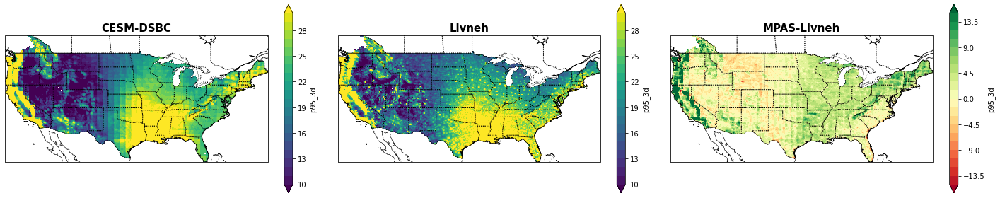

In [88]:
p99_liv  = ds_p95_liv.p95_2d
p99_cesm = ds_p95_cesm_dsbc.p95_3d.mean(dim=('member'))
p99_dif  = p99_cesm - p99_liv 
 
fig = plt.figure(figsize=(12,8), dpi=96) 

data_3d = xr.concat([p99_cesm, p99_liv, p99_dif] , "new_dim")
title_s = ['CESM-DSBC', 'Livneh', 'MPAS-Livneh']
cnlevel_0 = np.linspace(10, 30, num=21)
cnlevel_dif = np.linspace(-15, 15, num=21)

plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)
 
plt.savefig(dir_plot + "p95_cesm_dsbc.png", bbox_inches='tight')

#### n99
 - CESM

<Figure size 1152x768 with 0 Axes>

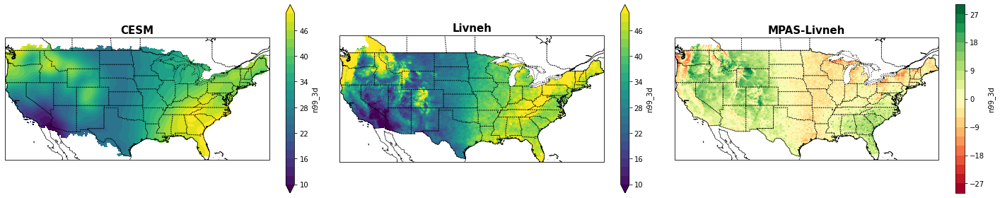

In [89]:
p99_liv  = ds_p95_liv.n99_2d
p99_cesm = ds_prec_cesm.n99_3d.mean(dim=('member'))
p99_dif  = p99_cesm - p99_liv 
 
fig = plt.figure(figsize=(12,8), dpi=96) 

data_3d = xr.concat([p99_cesm, p99_liv, p99_dif] , "new_dim")
title_s = ['CESM', 'Livneh', 'MPAS-Livneh']
cnlevel_0 = np.linspace(10, 50, num=21)
cnlevel_dif = np.linspace(-30, 30, num=21)

plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)
 
plt.savefig(dir_plot + "n99_cesm.png", bbox_inches='tight')

 - n99 CESM-DS

<Figure size 1152x768 with 0 Axes>

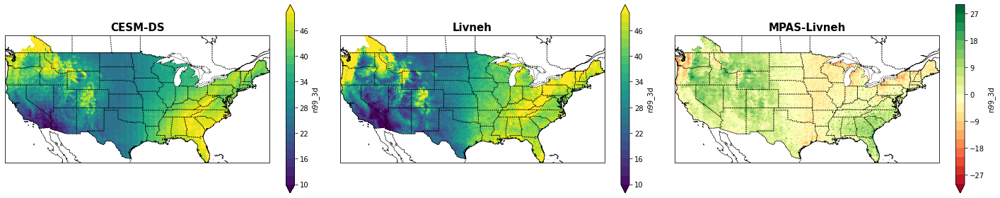

In [90]:
p99_liv  = ds_p95_liv.n99_2d
p99_cesm = ds_p95_cesm_ds.n99_3d.mean(dim=('member'))
p99_dif  = p99_cesm - p99_liv 
 
fig = plt.figure(figsize=(12,8), dpi=96) 

data_3d = xr.concat([p99_cesm, p99_liv, p99_dif] , "new_dim")
title_s = ['CESM-DS', 'Livneh', 'MPAS-Livneh']
cnlevel_0 = np.linspace(10, 50, num=21)
cnlevel_dif = np.linspace(-30, 30, num=21)

plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)
 
plt.savefig(dir_plot + "n99_cesm_ds.png", bbox_inches='tight')

 - n99 CESM-BC

<Figure size 1152x768 with 0 Axes>

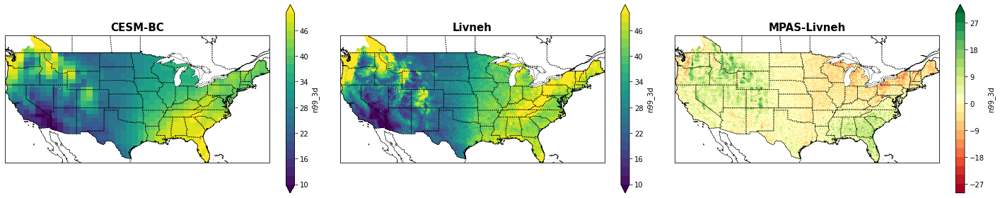

In [91]:
p99_liv  = ds_p95_liv.n99_2d
p99_cesm = ds_p95_cesm_bc.n99_3d.mean(dim=('member'))
p99_dif  = p99_cesm - p99_liv 
 
fig = plt.figure(figsize=(12,8), dpi=96) 

data_3d = xr.concat([p99_cesm, p99_liv, p99_dif] , "new_dim")
title_s = ['CESM-BC', 'Livneh', 'MPAS-Livneh']
cnlevel_0 = np.linspace(10, 50, num=21)
cnlevel_dif = np.linspace(-30, 30, num=21)

plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)
 
plt.savefig(dir_plot + "n99_cesm_bc.png", bbox_inches='tight')

 - n99 CESM-DSBC

<Figure size 1152x768 with 0 Axes>

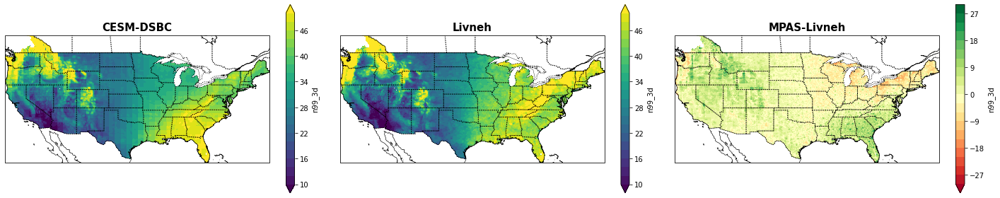

In [92]:
p99_liv  = ds_p95_liv.n99_2d
p99_cesm = ds_p95_cesm_dsbc.n99_3d.mean(dim=('member'))
p99_dif  = p99_cesm - p99_liv 
 
fig = plt.figure(figsize=(12,8), dpi=96) 

data_3d = xr.concat([p99_cesm, p99_liv, p99_dif] , "new_dim")
title_s = ['CESM-DSBC', 'Livneh', 'MPAS-Livneh']
cnlevel_0 = np.linspace(10, 50, num=21)
cnlevel_dif = np.linspace(-30, 30, num=21)

plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)
 
plt.savefig(dir_plot + "n99_cesm_dsbc.png", bbox_inches='tight')

#### N95
 - CESM

<Figure size 1152x768 with 0 Axes>

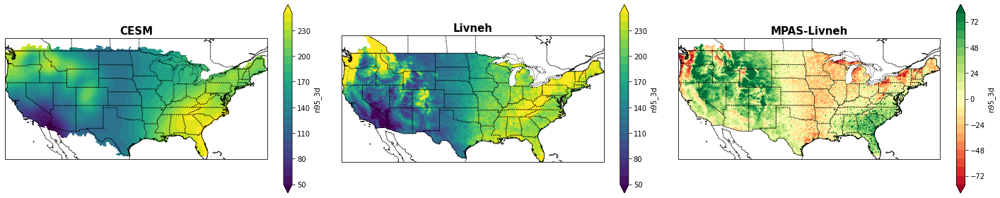

In [93]:
p99_liv  = ds_p95_liv.n95_2d
p99_cesm = ds_prec_cesm.n95_3d.mean(dim=('member'))
p99_dif  = p99_cesm - p99_liv 
 
fig = plt.figure(figsize=(12,8), dpi=96) 

data_3d = xr.concat([p99_cesm, p99_liv, p99_dif] , "new_dim")
title_s = ['CESM', 'Livneh', 'MPAS-Livneh']
cnlevel_0 = np.linspace(50, 250, num=21)
cnlevel_dif = np.linspace(-80, 80, num=21)

plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)
 
plt.savefig(dir_plot + "n95_cesm.png", bbox_inches='tight')

 - N95 CESM-DS

<Figure size 1152x768 with 0 Axes>

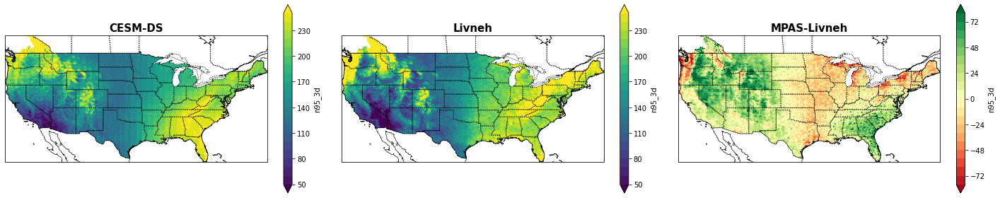

In [94]:
p99_liv  = ds_p95_liv.n95_2d
p99_cesm = ds_p95_cesm_ds.n95_3d.mean(dim=('member'))
p99_dif  = p99_cesm - p99_liv 
 
fig = plt.figure(figsize=(12,8), dpi=96) 

data_3d = xr.concat([p99_cesm, p99_liv, p99_dif] , "new_dim")
title_s = ['CESM-DS', 'Livneh', 'MPAS-Livneh']
cnlevel_0 = np.linspace(50, 250, num=21)
cnlevel_dif = np.linspace(-80, 80, num=21)

plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)
 
plt.savefig(dir_plot + "n95_cesm_ds.png", bbox_inches='tight')

 - N95: CESM-BC

<Figure size 1152x768 with 0 Axes>

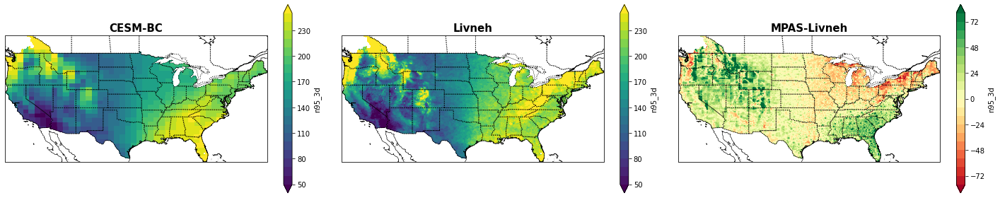

In [95]:
p99_liv  = ds_p95_liv.n95_2d
p99_cesm = ds_p95_cesm_bc.n95_3d.mean(dim=('member'))
p99_dif  = p99_cesm - p99_liv 
 
fig = plt.figure(figsize=(12,8), dpi=96) 

data_3d = xr.concat([p99_cesm, p99_liv, p99_dif] , "new_dim")
title_s = ['CESM-BC', 'Livneh', 'MPAS-Livneh']
cnlevel_0 = np.linspace(50, 250, num=21)
cnlevel_dif = np.linspace(-80, 80, num=21)

plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)
 
plt.savefig(dir_plot + "n95_cesm_bc.png", bbox_inches='tight')

 - N95:CESM-DSBC

<Figure size 1152x768 with 0 Axes>

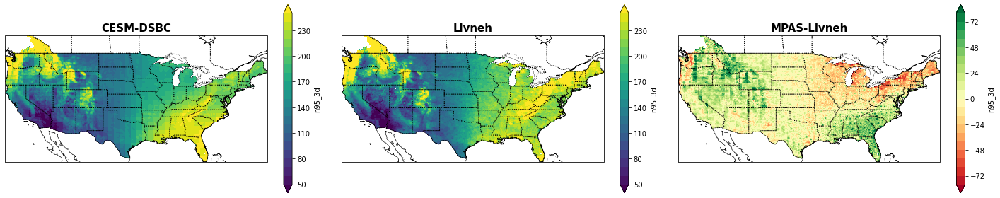

In [96]:
p99_liv  = ds_p95_liv.n95_2d
p99_cesm = ds_p95_cesm_dsbc.n95_3d.mean(dim=('member'))
p99_dif  = p99_cesm - p99_liv 
 
fig = plt.figure(figsize=(12,8), dpi=96) 

data_3d = xr.concat([p99_cesm, p99_liv, p99_dif] , "new_dim")
title_s = ['CESM-DSBC', 'Livneh', 'MPAS-Livneh']
cnlevel_0 = np.linspace(50, 250, num=21)
cnlevel_dif = np.linspace(-80, 80, num=21)

plot_mpas_diff_3(data_3d, title_s, cnlevel_0, cnlevel_dif)
 
plt.savefig(dir_plot + "n95_cesm_dsbc.png", bbox_inches='tight')

#### Seasonal Precipitation
 - Livneh

<Figure size 576x432 with 0 Axes>

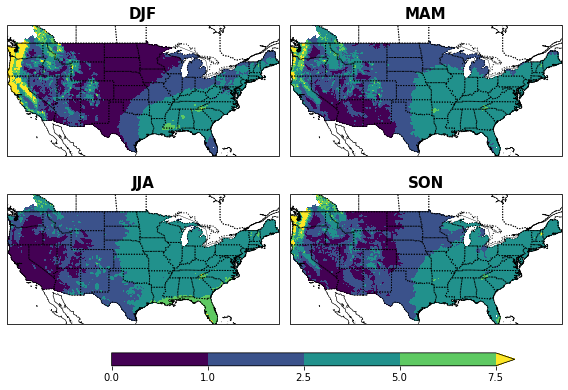

In [115]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_mean_liv.prec_season_3d 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv', 0, 7.5, 'viridis')

plt.savefig(dir_plot + "prec_livneh_seasonal.png", bbox_inches='tight', dpi=100) 

 - Precipitation: CESM

<Figure size 576x432 with 0 Axes>

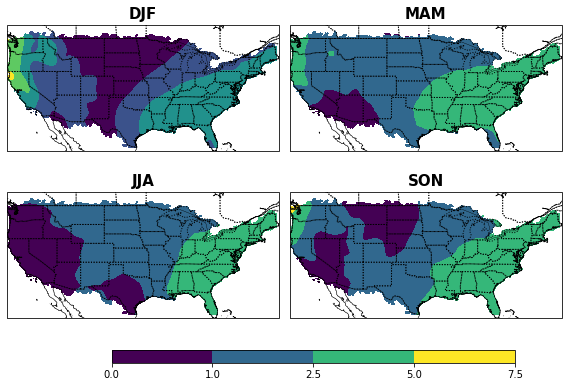

In [18]:
fig = plt.figure(figsize=(8,6)) 

prec_season_cesm = ds_prec_cesm.prec_season_4d.mean(dim=('member')) 
plot_seasonal('cesm', prec_season_cesm, 'prec_season_cesm',0, 7.5, 'viridis')

plt.savefig(dir_plot + "prec_cesm_seasonal.png", bbox_inches='tight') 

 - Precipitations: CESM-DS

<Figure size 576x432 with 0 Axes>

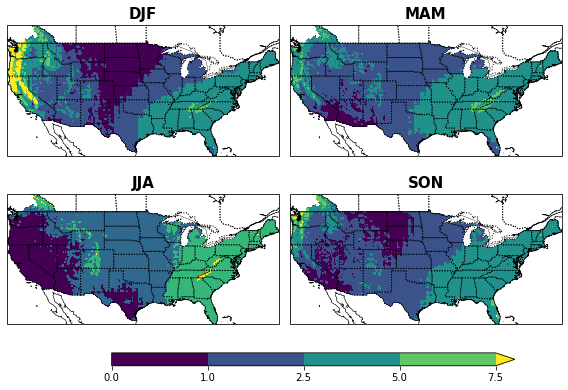

In [116]:
fig = plt.figure(figsize=(8,6)) 

prec_season_cesm = ds_mean_cesm_ds.prec_season_4d.mean(dim=('member')) 
plot_seasonal('cesm-ds', prec_season_cesm, 'prec_season_cesm',0, 7.5, 'viridis')

plt.savefig(dir_plot + "prec_cesm_ds_seasonal.png", bbox_inches='tight') 

 - Precipitation: CESM-BC

<Figure size 576x432 with 0 Axes>

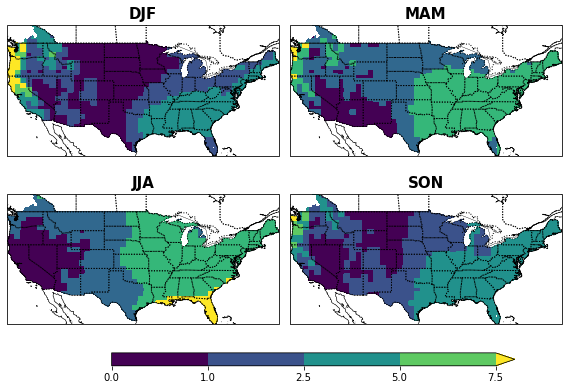

In [117]:
fig = plt.figure(figsize=(8,6)) 

prec_season_cesm = ds_mean_cesm_bc.prec_season_4d.mean(dim=('member')) 
plot_seasonal('cesm-ds', prec_season_cesm, 'prec_season_cesm',0, 7.5, 'viridis')

plt.savefig(dir_plot + "prec_cesm_bc_seasonal.png", bbox_inches='tight') ;

 - precipitation: CESM-DSBC

<Figure size 576x432 with 0 Axes>

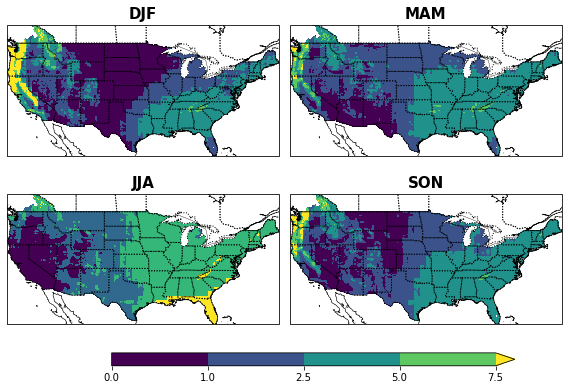

In [118]:
fig = plt.figure(figsize=(8,6)) 

prec_season_cesm = ds_mean_cesm_dsbc.prec_season_4d.mean(dim=('member')) 
plot_seasonal('cesm-ds', prec_season_cesm, 'prec_season_cesm',0, 7.5, 'viridis')

plt.savefig(dir_plot + "prec_cesm_dsbc_seasonal.png", bbox_inches='tight') 

 - Precipitation difference: CESM-Livneh

<Figure size 576x432 with 0 Axes>

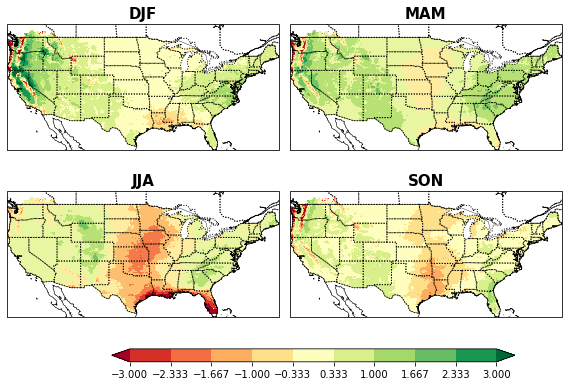

In [19]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_prec_cesm.prec_season_4d.mean(dim='member') - ds_mean_liv.prec_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -3, 3, 'RdYlGn');

plt.savefig(dir_plot + "prec_cesm-livneh_seasonal.png", bbox_inches='tight');

 - precipitation difference: CESM-DS - Livneh

<Figure size 576x432 with 0 Axes>

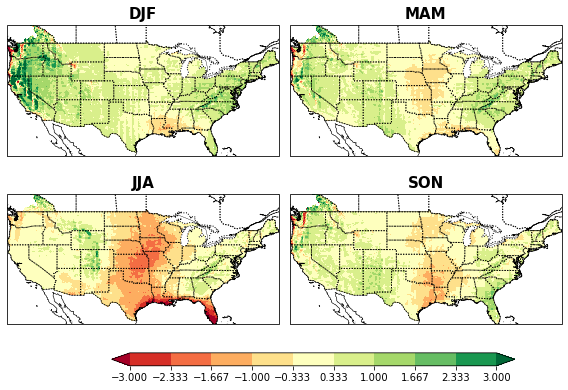

In [119]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_mean_cesm_ds.prec_season_4d.mean(dim='member') - ds_mean_liv.prec_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -3, 3, 'RdYlGn');

plt.savefig(dir_plot + "prec_cesm_ds-livneh_seasonal.png", bbox_inches='tight');

 - Precipitation: CESM-BC - Livneh

<Figure size 576x432 with 0 Axes>

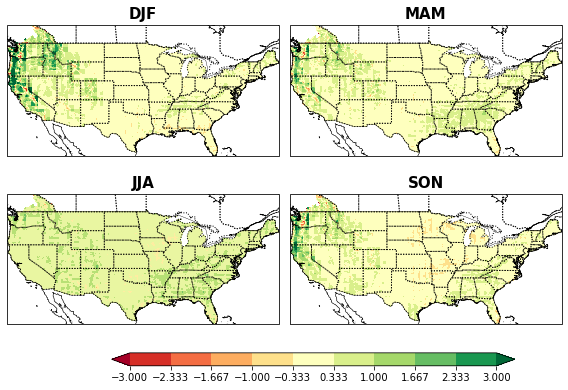

In [120]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_mean_cesm_bc.prec_season_4d.mean(dim='member') - ds_mean_liv.prec_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -3, 3, 'RdYlGn');

plt.savefig(dir_plot + "prec_cesm_bc-livneh_seasonal.png", bbox_inches='tight');

 - precipitation : CESM-DSBC - Livneh

<Figure size 576x432 with 0 Axes>

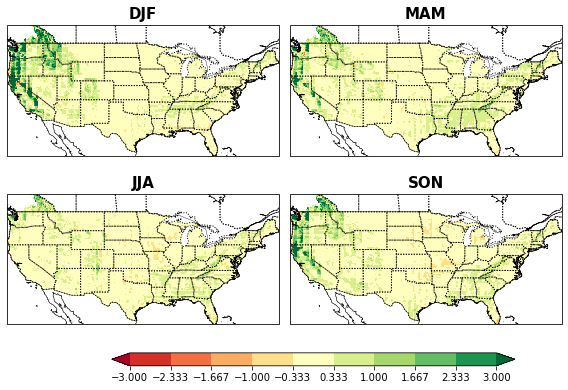

In [121]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_mean_cesm_dsbc.prec_season_4d.mean(dim='member') - ds_mean_liv.prec_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -3, 3, 'RdYlGn');

plt.savefig(dir_plot + "prec_cesm_dsbc-livneh_seasonal.png", bbox_inches='tight');

#### Seasonal NWD
 - Livneh

<Figure size 576x432 with 0 Axes>

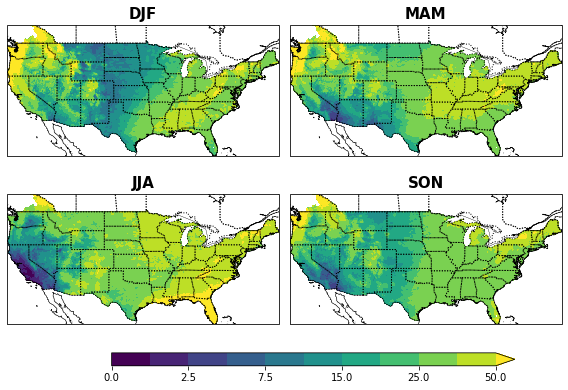

In [122]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_mean_liv.nwd_season_3d 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 50, 'viridis')

plt.savefig(dir_plot + "nwd_livneh_seasonal.png", bbox_inches='tight') 

 - NWD: CESM

<Figure size 576x432 with 0 Axes>

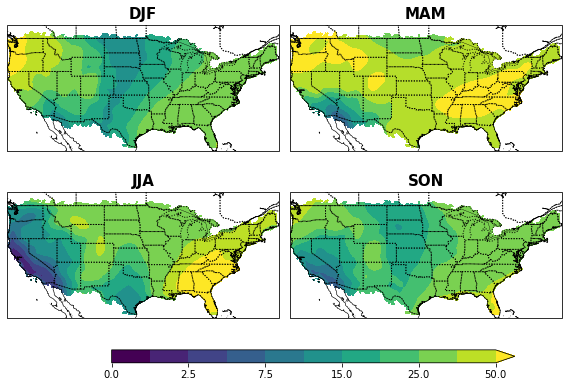

In [20]:
fig = plt.figure(figsize=(8,6)) 

prec_season_cesm = ds_prec_cesm.nwd_season_4d.mean(dim=('member')) 
plot_seasonal('cesm', prec_season_cesm, 'prec_season_cesm',0, 50, 'viridis')

plt.savefig(dir_plot + "nwd_cesm_seasonal.png", bbox_inches='tight') 

 - NWD: CESM-DS

<Figure size 576x432 with 0 Axes>

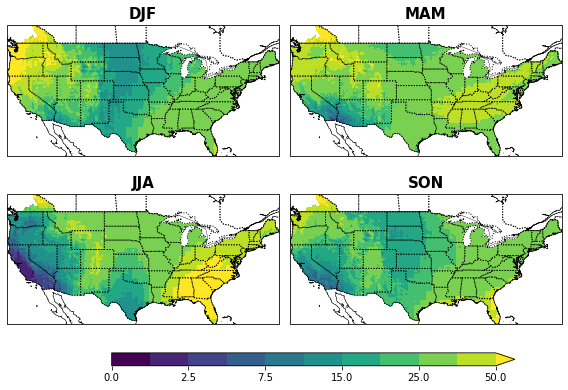

In [123]:
fig = plt.figure(figsize=(8,6)) 

prec_season_cesm = ds_mean_cesm_ds.nwd_season_4d.mean(dim=('member')) 
plot_seasonal('cesm-ds', prec_season_cesm, 'prec_season_cesm',0, 50, 'viridis')

plt.savefig(dir_plot + "nwd_cesm_ds_seasonal.png", bbox_inches='tight') 

 - NWD: CESM-BC

<Figure size 576x432 with 0 Axes>

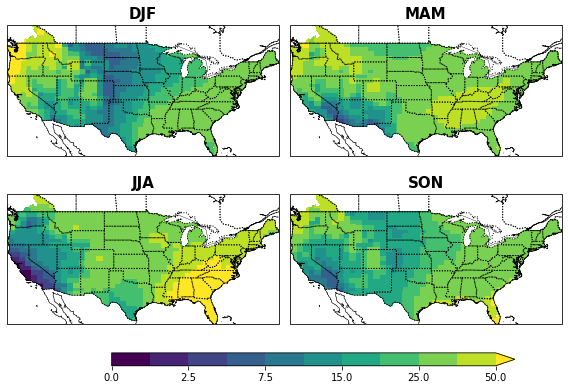

In [124]:
fig = plt.figure(figsize=(8,6)) 

prec_season_cesm = ds_mean_cesm_bc.nwd_season_4d.mean(dim=('member')) 
plot_seasonal('cesm-ds', prec_season_cesm, 'prec_season_cesm',0, 50, 'viridis')

plt.savefig(dir_plot + "nwd_cesm_bc_seasonal.png", bbox_inches='tight') ;

 - NWD: CESM-DSBC

<Figure size 576x432 with 0 Axes>

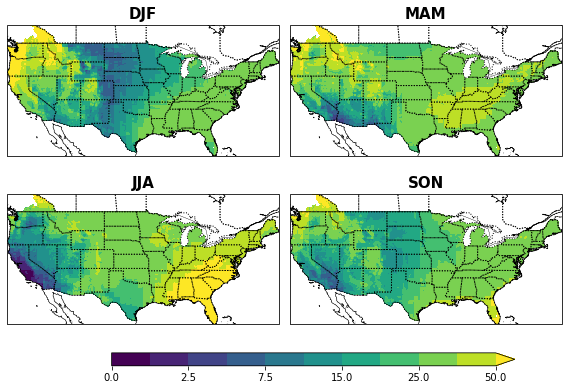

In [125]:
fig = plt.figure(figsize=(8,6)) 

prec_season_cesm = ds_mean_cesm_dsbc.nwd_season_4d.mean(dim=('member')) 
plot_seasonal('cesm-ds', prec_season_cesm, 'prec_season_cesm',0, 50, 'viridis')

plt.savefig(dir_plot + "nwd_cesm_dsbc_seasonal.png", bbox_inches='tight')

 - NWD: CESM-Livneh

<Figure size 576x432 with 0 Axes>

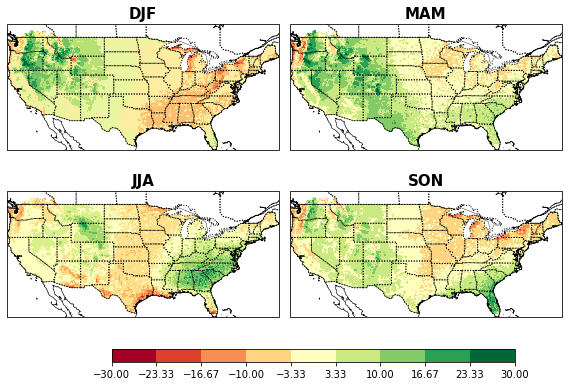

In [21]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_prec_cesm.nwd_season_4d.mean(dim='member') - ds_mean_liv.nwd_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -30, 30, 'RdYlGn');

plt.savefig(dir_plot + "nwd_cesm-livneh_seasonal.png", bbox_inches='tight');

 - NWD: CESM-DS-Livneh

<Figure size 576x432 with 0 Axes>

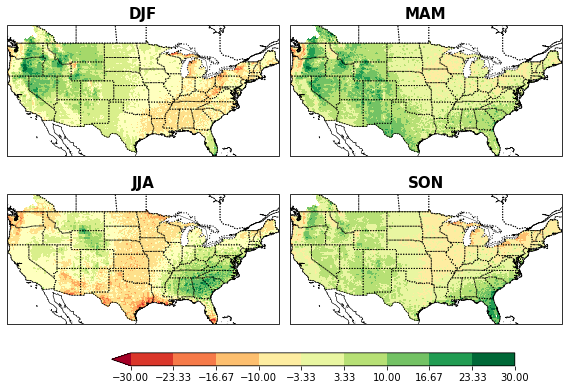

In [126]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_mean_cesm_ds.nwd_season_4d.mean(dim='member') - ds_mean_liv.nwd_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -30, 30, 'RdYlGn');

plt.savefig(dir_plot + "nwd_cesm_ds-livneh_seasonal.png", bbox_inches='tight');

 - NWD: CESM-BC - Livneh

<Figure size 576x432 with 0 Axes>

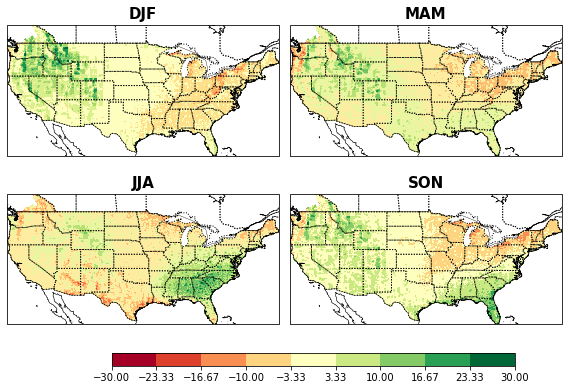

In [127]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_mean_cesm_bc.nwd_season_4d.mean(dim='member') - ds_mean_liv.nwd_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -30, 30, 'RdYlGn');

plt.savefig(dir_plot + "nwd_cesm_bc-livneh_seasonal.png", bbox_inches='tight');

 - NWD: CESM-DSBC - Livneh

<Figure size 576x432 with 0 Axes>

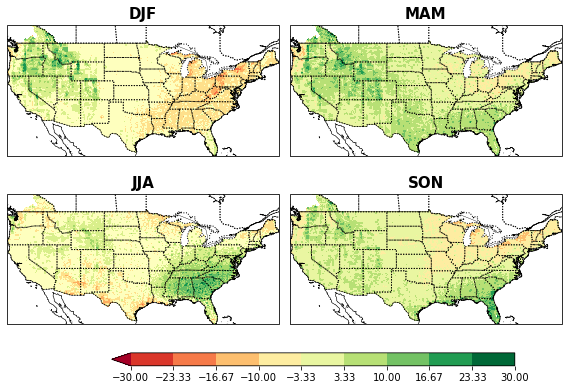

In [128]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_mean_cesm_dsbc.nwd_season_4d.mean(dim='member') - ds_mean_liv.nwd_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -30, 30, 'RdYlGn');

plt.savefig(dir_plot + "nwd_cesm_dsbc-livneh_seasonal.png", bbox_inches='tight');

#### P99 of Seasonal precipitation
 - Livneh

<Figure size 576x432 with 0 Axes>

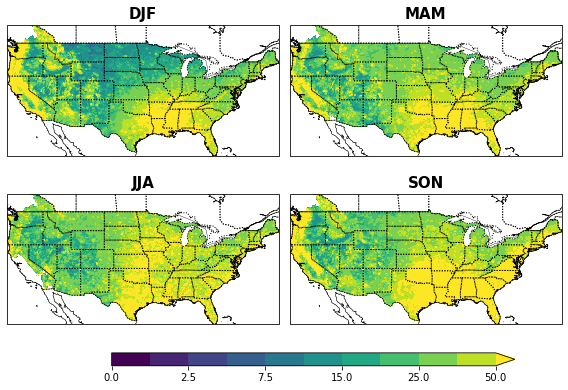

In [129]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_p95_liv.p99_season_3d 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 50, 'viridis')

plt.savefig(dir_plot + "p99_livneh_seasonal.png", bbox_inches='tight') 

 - P99: CESM

<Figure size 576x432 with 0 Axes>

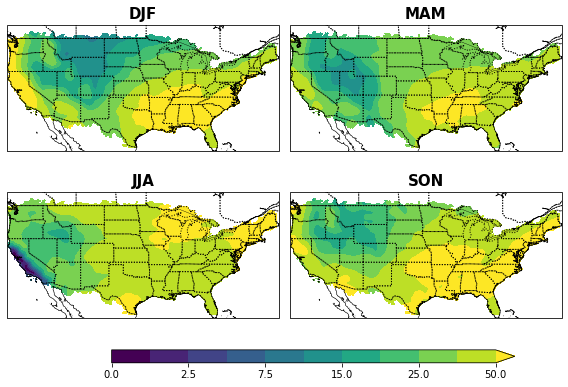

In [22]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_prec_cesm.p99_season_4d.mean(dim='member') 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 50, 'viridis')

plt.savefig(dir_plot + "p99_cesm_seasonal.png", bbox_inches='tight') 

 - P99 CESM-DS

<Figure size 576x432 with 0 Axes>

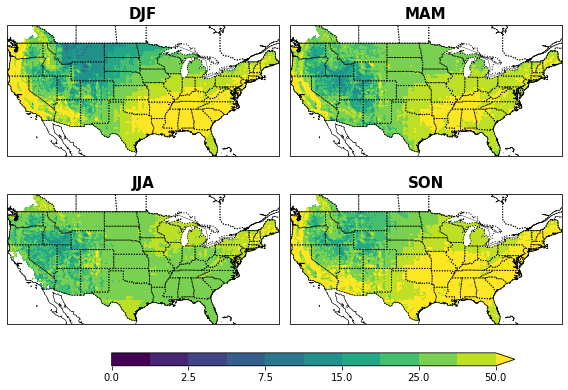

In [130]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_p95_cesm_ds.p99_season_4d.mean(dim='member') 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 50, 'viridis')

plt.savefig(dir_plot + "p99_cesm_ds_seasonal.png", bbox_inches='tight') 

 - P99 CESM-BC

<Figure size 576x432 with 0 Axes>

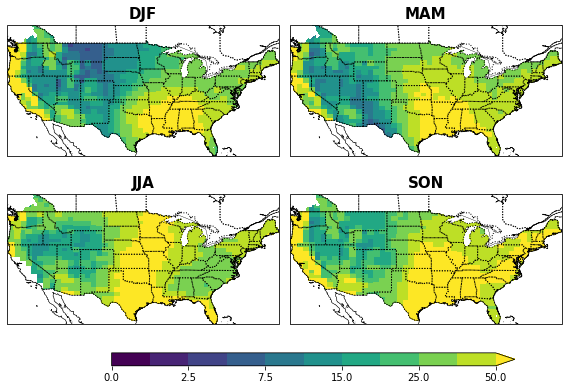

In [131]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_p95_cesm_bc.p99_season_4d.mean(dim='member') 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 50, 'viridis')

plt.savefig(dir_plot + "p99_cesm_bc_seasonal.png", bbox_inches='tight') 

 - P99: CESM-DSBC

<Figure size 576x432 with 0 Axes>

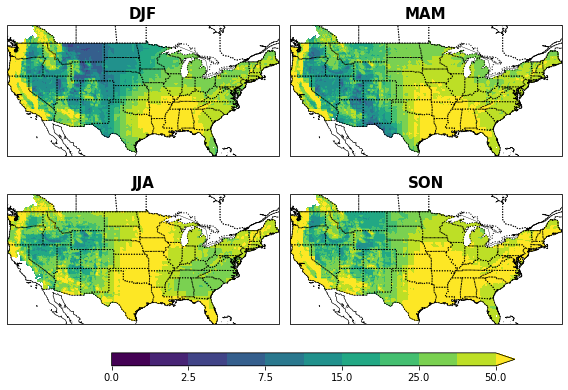

In [132]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_p95_cesm_dsbc.p99_season_4d.mean(dim='member') 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 50, 'viridis')

plt.savefig(dir_plot + "p99_cesm_dsbc_seasonal.png", bbox_inches='tight') 

 - P99 differences: CESM-Livneh

<Figure size 576x432 with 0 Axes>

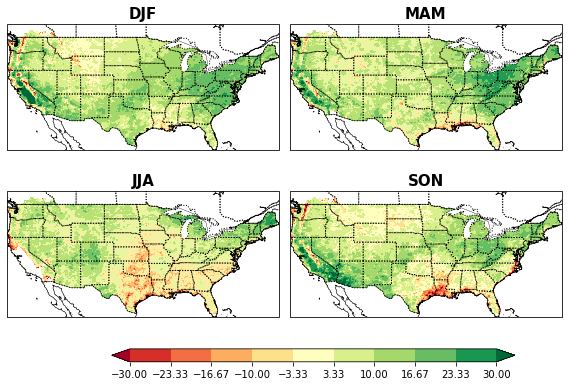

In [23]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_prec_cesm.p99_season_4d.mean(dim='member') - ds_p95_liv.p99_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -30, 30, 'RdYlGn');

plt.savefig(dir_plot + "p99_cesm-livneh_seasonal.png", bbox_inches='tight');

 - P99 difference : CESM-DS - Livneh

<Figure size 576x432 with 0 Axes>

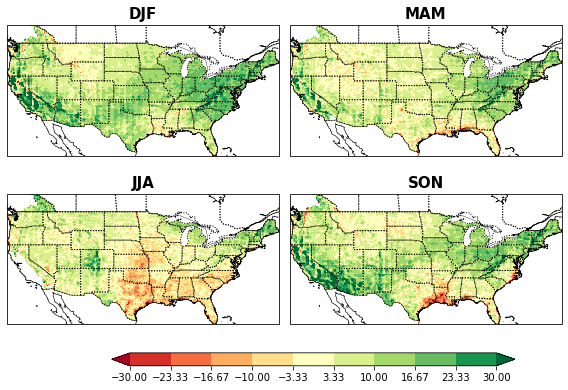

In [133]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_p95_cesm_ds.p99_season_4d.mean(dim='member') - ds_p95_liv.p99_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -30, 30, 'RdYlGn');

plt.savefig(dir_plot + "p99_cesm_ds-livneh_seasonal.png", bbox_inches='tight');

 - p99 difference: CESM-BC - Livneh

<Figure size 576x432 with 0 Axes>

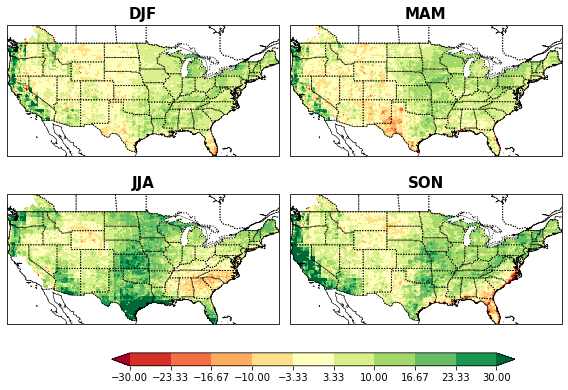

In [134]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_p95_cesm_bc.p99_season_4d.mean(dim='member') - ds_p95_liv.p99_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -30, 30, 'RdYlGn');

plt.savefig(dir_plot + "p99_cesm_bc-livneh_seasonal.png", bbox_inches='tight');

 - P99 difference: CESM-DSBC - Livneh

<Figure size 576x432 with 0 Axes>

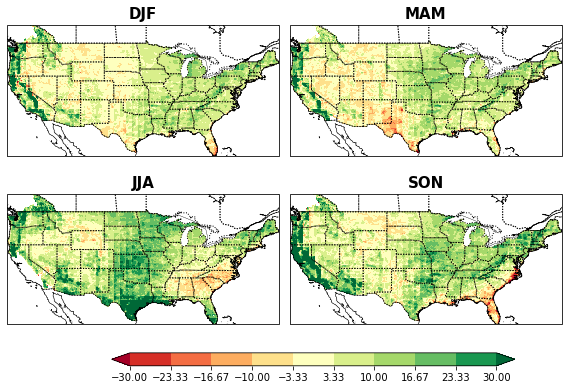

In [135]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_p95_cesm_dsbc.p99_season_4d.mean(dim='member') - ds_p95_liv.p99_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -30, 30, 'RdYlGn');

plt.savefig(dir_plot + "p99_cesm_dsbc-livneh_seasonal.png", bbox_inches='tight');

#### P95 of Seasonal precipitation
 - Livneh

<Figure size 576x432 with 0 Axes>

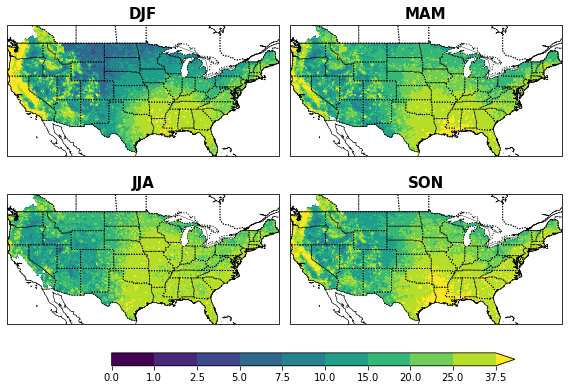

In [136]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_p95_liv.p95_season_3d 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 37.5, 'viridis')

plt.savefig(dir_plot + "p95_livneh_seasonal.png", bbox_inches='tight') 

 - P95:CESM

<Figure size 576x432 with 0 Axes>

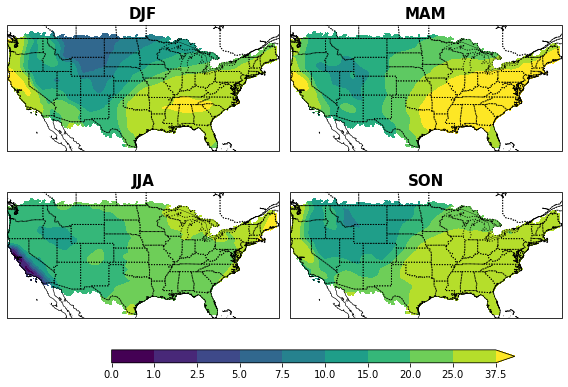

In [24]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_prec_cesm.p95_season_4d.mean(dim='member') 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 37.5, 'viridis')

plt.savefig(dir_plot + "p95_cesm_seasonal.png", bbox_inches='tight') 

 - P95: CESM-DS

<Figure size 576x432 with 0 Axes>

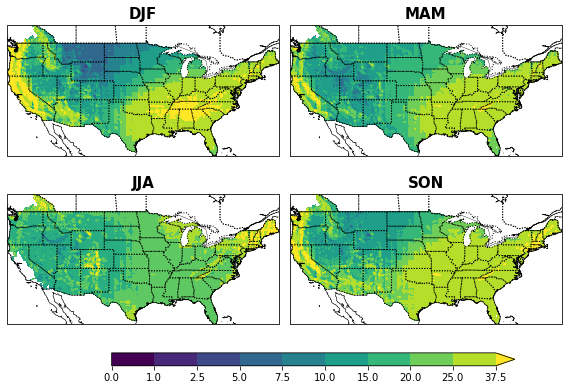

In [137]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_p95_cesm_ds.p95_season_4d.mean(dim='member') 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 37.5, 'viridis')

plt.savefig(dir_plot + "p95_cesm_ds_seasonal.png", bbox_inches='tight') 

 - P95: CESM-BC

<Figure size 576x432 with 0 Axes>

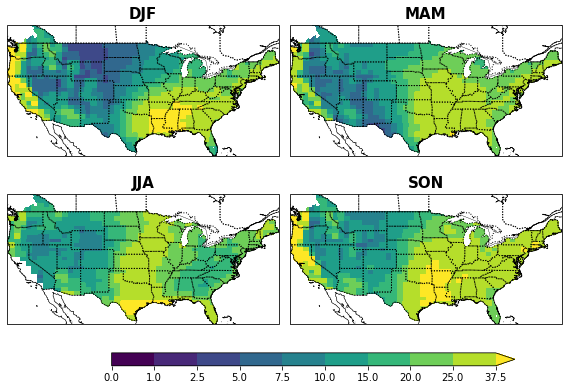

In [138]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_p95_cesm_bc.p95_season_4d.mean(dim='member') 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 37.5, 'viridis')

plt.savefig(dir_plot + "p95_cesm_bc_seasonal.png", bbox_inches='tight') 

 - P95: CESM-DSBC

<Figure size 576x432 with 0 Axes>

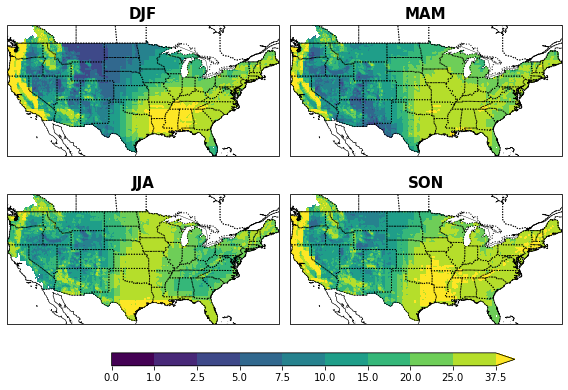

In [139]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_p95_cesm_dsbc.p95_season_4d.mean(dim='member') 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 37.5, 'viridis')

plt.savefig(dir_plot + "p95_cesm_dsbc_seasonal.png", bbox_inches='tight') 

 - P95 difference: CESM-Livneh

<Figure size 576x432 with 0 Axes>

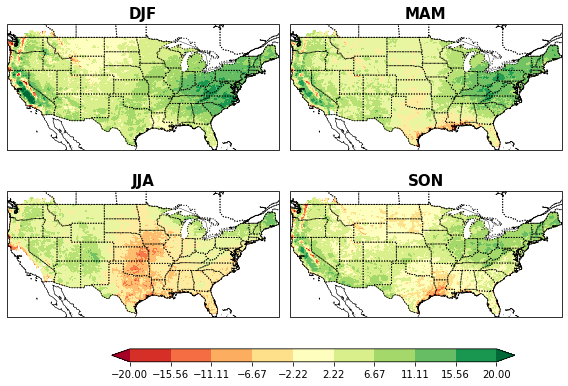

In [26]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_prec_cesm.p95_season_4d.mean(dim='member') - ds_p95_liv.p95_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -20, 20, 'RdYlGn');

plt.savefig(dir_plot + "p95_cesm-livneh_seasonal.png", bbox_inches='tight');

 - P95 difference: CESM_DS - Livneh

<Figure size 576x432 with 0 Axes>

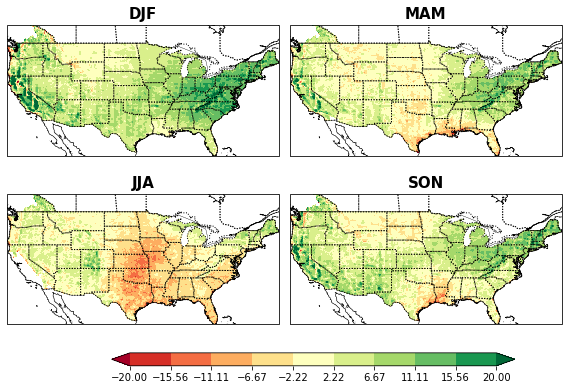

In [140]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_p95_cesm_ds.p95_season_4d.mean(dim='member') - ds_p95_liv.p95_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -20, 20, 'RdYlGn');

plt.savefig(dir_plot + "p95_cesm_ds-livneh_seasonal.png", bbox_inches='tight');

 - P95 difference: CESM_BC - Livneh

<Figure size 576x432 with 0 Axes>

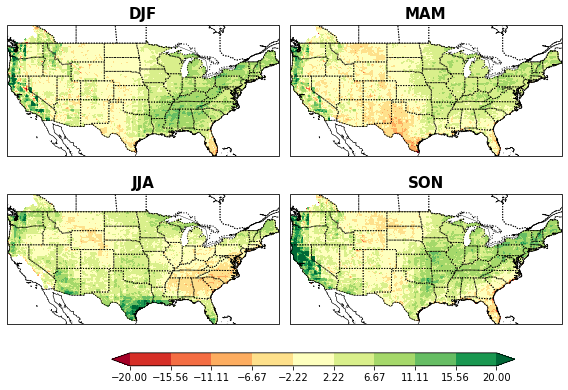

In [141]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_p95_cesm_bc.p95_season_4d.mean(dim='member') - ds_p95_liv.p95_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -20, 20, 'RdYlGn');

plt.savefig(dir_plot + "p95_cesm_bc-livneh_seasonal.png", bbox_inches='tight'); 

 - P95 difference: CESM_DSBC - Livneh

<Figure size 576x432 with 0 Axes>

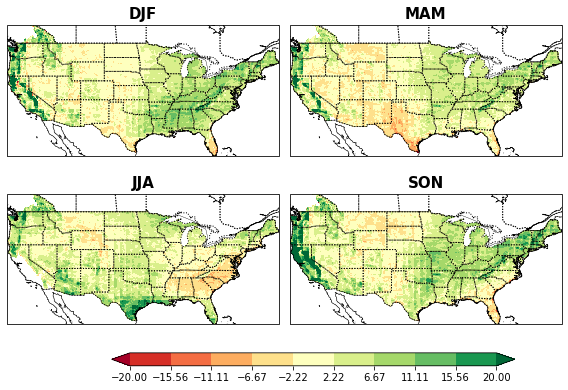

In [142]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_p95_cesm_dsbc.p95_season_4d.mean(dim='member') - ds_p95_liv.p95_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -20, 20, 'RdYlGn');

plt.savefig(dir_plot + "p95_cesm_dsbc-livneh_seasonal.png", bbox_inches='tight');

#### N99
 - Livneh

<Figure size 576x432 with 0 Axes>

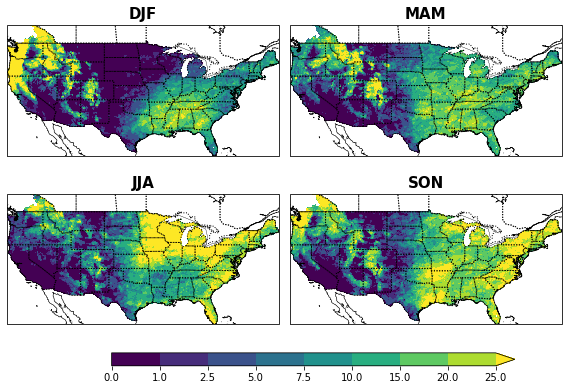

In [143]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_p95_liv.n99_season_3d 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 25, 'viridis')

plt.savefig(dir_plot + "n99_livneh_seasonal.png", bbox_inches='tight') 

 - N99: CESM

<Figure size 576x432 with 0 Axes>

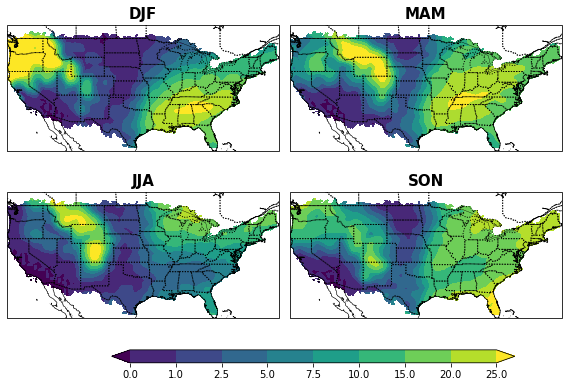

In [27]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_prec_cesm.n99_season_4d.mean(dim='member') 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 25, 'viridis')

plt.savefig(dir_plot + "n99_cesm_seasonal.png", bbox_inches='tight') 

 - N99 CESM-DS

<Figure size 576x432 with 0 Axes>

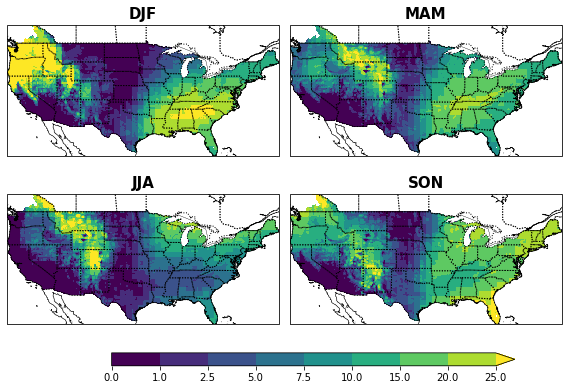

In [144]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_p95_cesm_ds.n99_season_4d.mean(dim='member') 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 25, 'viridis')

plt.savefig(dir_plot + "n99_cesm_ds_seasonal.png", bbox_inches='tight') 

 - N99 CESM-BC

<Figure size 576x432 with 0 Axes>

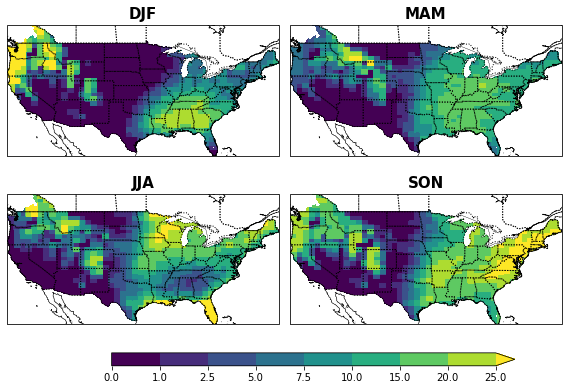

In [145]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_p95_cesm_bc.n99_season_4d.mean(dim='member') 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 25, 'viridis')

plt.savefig(dir_plot + "n99_cesm_bc_seasonal.png", bbox_inches='tight') 

 - N99 CESM-DSBC

<Figure size 576x432 with 0 Axes>

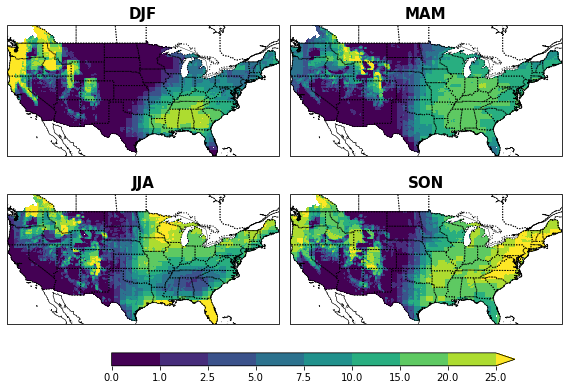

In [146]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_p95_cesm_dsbc.n99_season_4d.mean(dim='member') 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 25, 'viridis')

plt.savefig(dir_plot + "n99_cesm_dsbc_seasonal.png", bbox_inches='tight') 

 - N99 difference: CESM-Livneh

<Figure size 576x432 with 0 Axes>

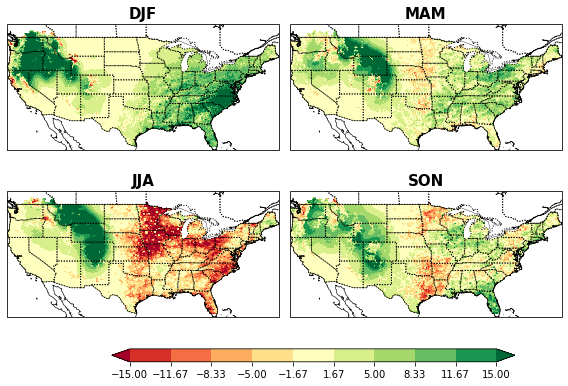

In [32]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_prec_cesm.n99_season_4d.mean(dim='member') - ds_p95_liv.n99_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -15, 15, 'RdYlGn');

plt.savefig(dir_plot + "n99_cesm-livneh_seasonal.png", bbox_inches='tight');

 - N99 Difference CESM_DS - Livneh

<Figure size 576x432 with 0 Axes>

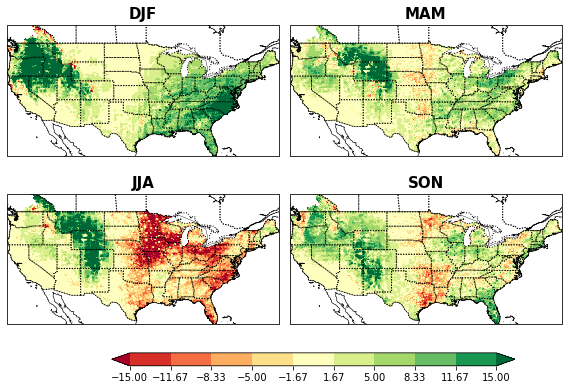

In [147]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_p95_cesm_ds.n99_season_4d.mean(dim='member') - ds_p95_liv.n99_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -15, 15, 'RdYlGn');

plt.savefig(dir_plot + "n99_cesm_ds-livneh_seasonal.png", bbox_inches='tight');

 - N99 CESM_BC - Livneh

<Figure size 576x432 with 0 Axes>

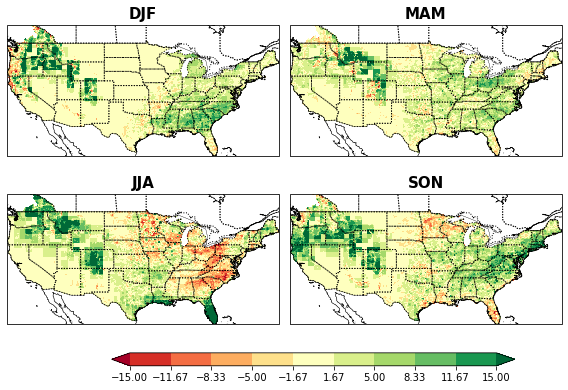

In [148]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_p95_cesm_bc.n99_season_4d.mean(dim='member') - ds_p95_liv.n99_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -15, 15, 'RdYlGn');

plt.savefig(dir_plot + "n99_cesm_bc-livneh_seasonal.png", bbox_inches='tight');

 - N99 CESM_DSBC - Livneh

<Figure size 576x432 with 0 Axes>

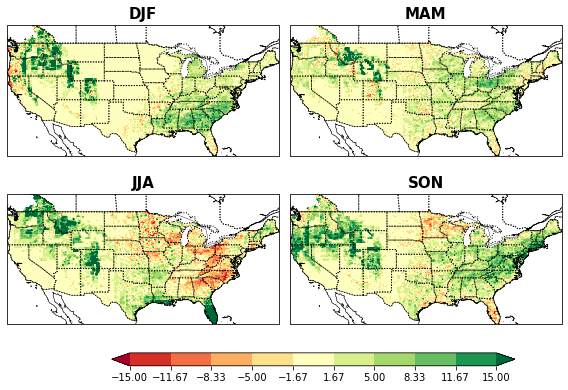

In [149]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_p95_cesm_dsbc.n99_season_4d.mean(dim='member') - ds_p95_liv.n99_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -15, 15, 'RdYlGn');

plt.savefig(dir_plot + "n99_cesm_dsbc-livneh_seasonal.png", bbox_inches='tight');

#### N95
 - Livneh

<Figure size 576x432 with 0 Axes>

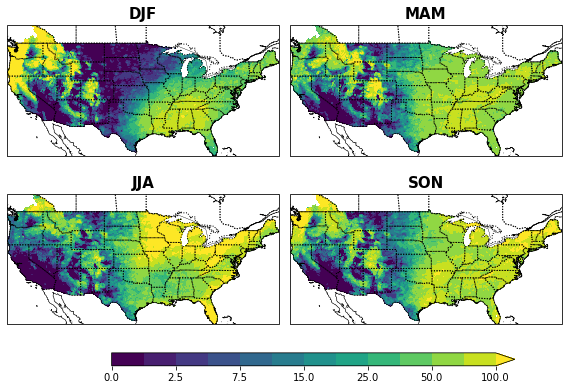

In [9]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_p95_liv.n95_season_3d 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 100, 'viridis')

plt.savefig(dir_plot + "n95_livneh_seasonal.png", bbox_inches='tight') 

 - N95 CESM

<Figure size 576x432 with 0 Axes>

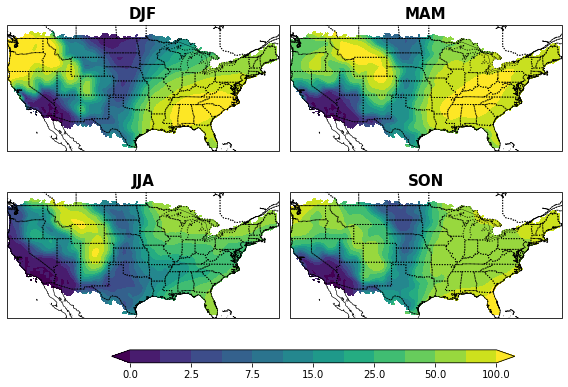

In [31]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_prec_cesm.n95_season_4d.mean(dim='member') 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 100, 'viridis')

plt.savefig(dir_plot + "n95_cesm_seasonal.png", bbox_inches='tight') 

 - N95 CESM-DS

<Figure size 576x432 with 0 Axes>

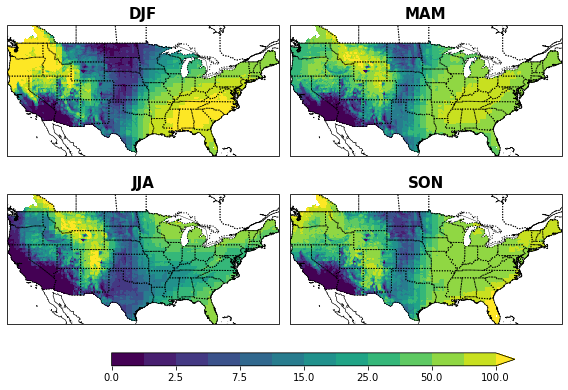

In [10]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_p95_cesm_ds.n95_season_4d.mean(dim='member') 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 100, 'viridis')

plt.savefig(dir_plot + "n95_cesm_ds_seasonal.png", bbox_inches='tight') 

 - N95 CESM-BC

<Figure size 576x432 with 0 Axes>

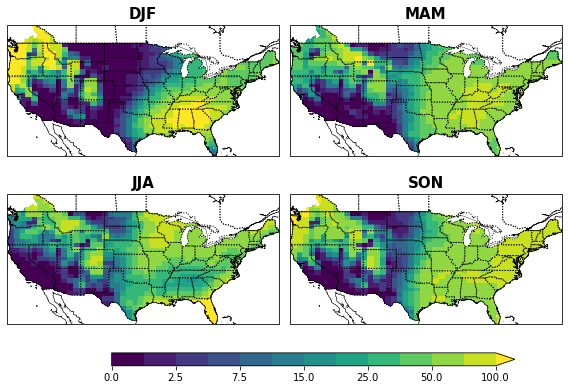

In [11]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_p95_cesm_bc.n95_season_4d.mean(dim='member') 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 100, 'viridis')

plt.savefig(dir_plot + "n95_cesm_bc_seasonal.png", bbox_inches='tight') 

 - N95 CESM-DSBC

<Figure size 576x432 with 0 Axes>

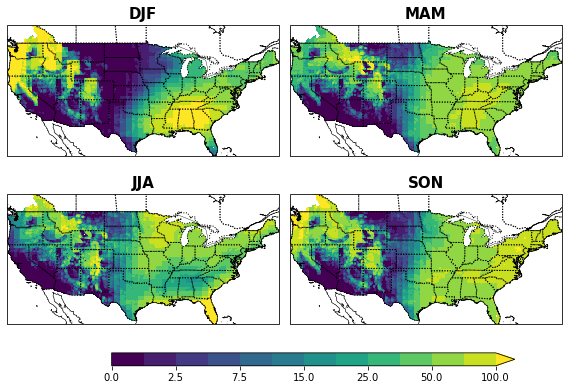

In [12]:
fig = plt.figure(figsize=(8,6)) 

prec_season_liv = ds_p95_cesm_dsbc.n95_season_4d.mean(dim='member') 
plot_seasonal('livneh', prec_season_liv, 'prec_season_liv',0, 100, 'viridis')

plt.savefig(dir_plot + "n95_cesm_dsbc_seasonal.png", bbox_inches='tight') 

 - N95 CESM-Livneh

In [ ]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_prec_cesm.n95_season_4d.mean(dim='member') - ds_p95_liv.n95_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -75, 75, 'RdYlGn');

plt.savefig(dir_plot + "n95_cesm-livneh_seasonal.png", bbox_inches='tight');

 - N95 CESM_DS - Livneh

<Figure size 576x432 with 0 Axes>

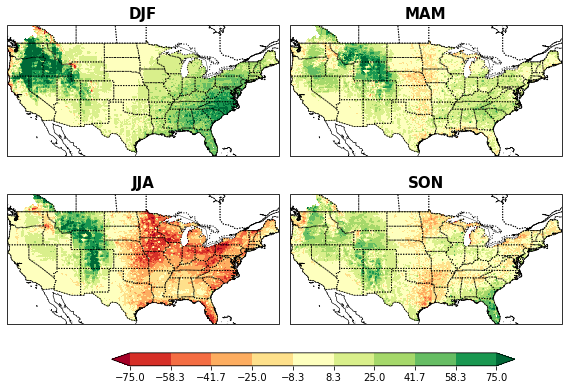

In [13]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_p95_cesm_ds.n95_season_4d.mean(dim='member') - ds_p95_liv.n95_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -75, 75, 'RdYlGn');

plt.savefig(dir_plot + "n95_cesm_ds-livneh_seasonal.png", bbox_inches='tight');

 - N95 CESM_BC - Livneh

<Figure size 576x432 with 0 Axes>

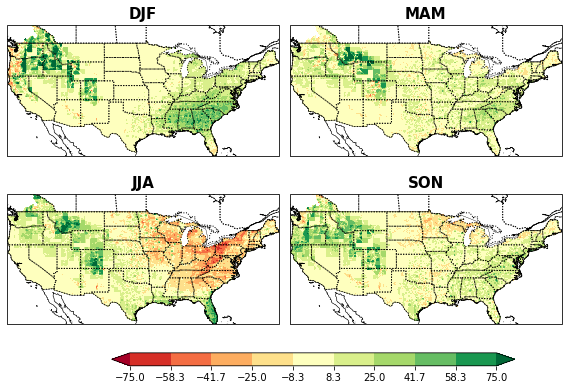

In [14]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_p95_cesm_bc.n95_season_4d.mean(dim='member') - ds_p95_liv.n95_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -75, 75, 'RdYlGn');

plt.savefig(dir_plot + "n95_cesm_bc-livneh_seasonal.png", bbox_inches='tight');

 - N95: CESM_DSBC - Livneh

<Figure size 576x432 with 0 Axes>

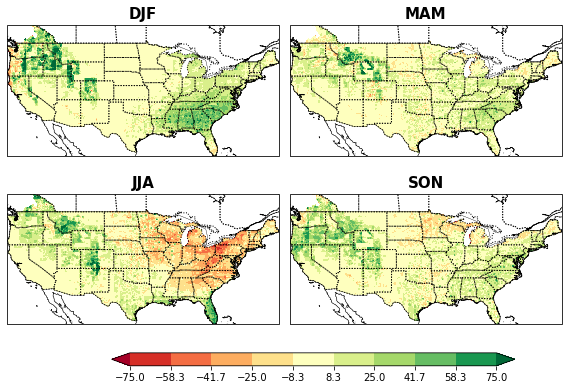

In [15]:
fig = plt.figure(figsize=(8,6)) 

prec_season_dif = ds_p95_cesm_dsbc.n95_season_4d.mean(dim='member') - ds_p95_liv.n95_season_3d
plot_seasonal('diff_cesm', prec_season_dif, 'prec_season_dif', -75, 75, 'RdYlGn');

plt.savefig(dir_plot + "n95_cesm_dsbc-livneh_seasonal.png", bbox_inches='tight');